# Suriya Kasiyalan Siva
## Homework 3

## PART 1
### (A)

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import least_squares

Do images exist in the folder: True


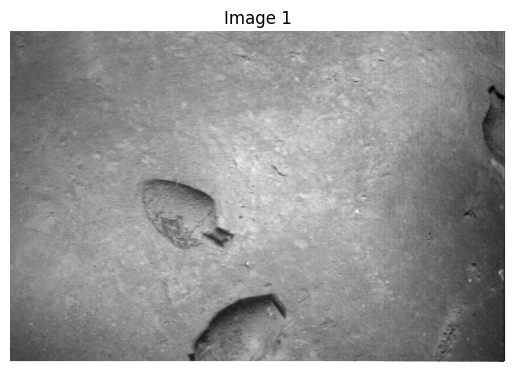

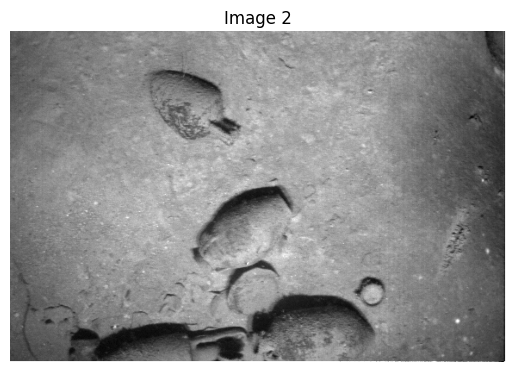

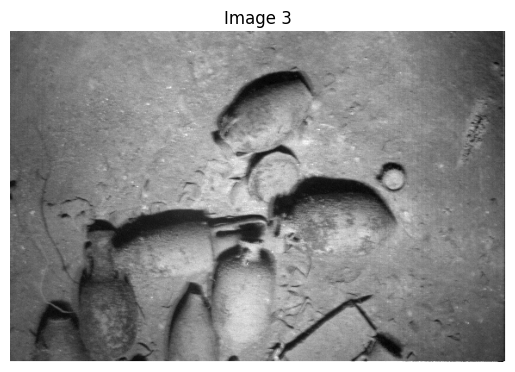

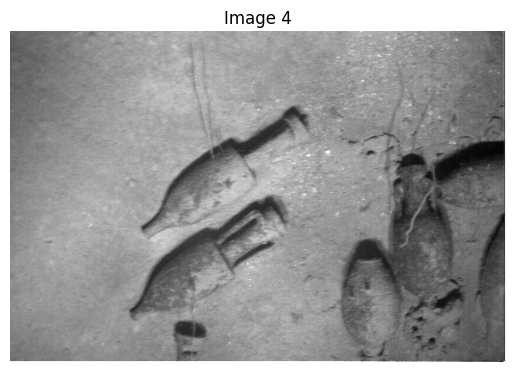

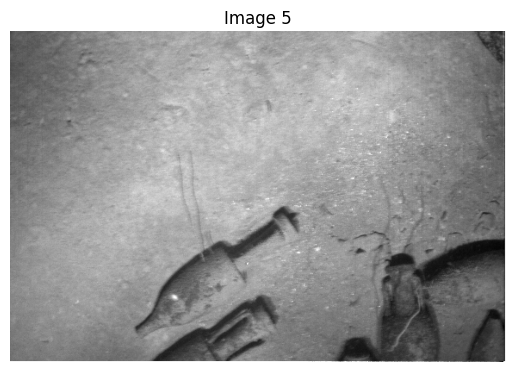

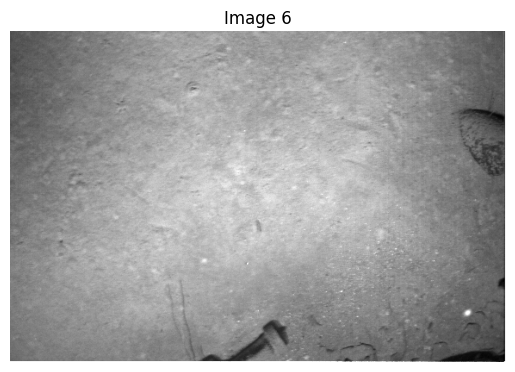

In [2]:
# Function to load images from a folder
def load_images_from_folder(folder_path):
    images = []
    filenames = sorted(os.listdir(folder_path))  # Sort filenames to ensure order
    for filename in filenames:
        file_path = os.path.join(folder_path, filename)
        image = cv2.imread(file_path)
        if image is not None:
            images.append(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    return images

folder_path = r'/content/drive/MyDrive/AFR/HW3/Images_6'
print("Do images exist in the folder:", os.path.exists(folder_path))
images = load_images_from_folder(folder_path)

for i, image in enumerate(images):
    plt.imshow(image)
    plt.title(f'Image {i+1}')
    plt.axis('off')
    plt.show()

In [3]:
def clahe_image(image):
    # Apply clahe to the image
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    # Convert the image to grayscale if needed
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    X = clahe.apply(gray_image)
    return X

def detect_keypoints_and_descriptors(image, mode):

    if mode == 1:
        sift = cv2.SIFT_create()
    elif mode == 2:
        sift = cv2.SIFT_create(
            nfeatures=0,  # Set to 0 to detect all features
            nOctaveLayers=3,
            contrastThreshold=0.03,
            edgeThreshold=18,
            sigma=1.0
        )
    elif mode == 3:
        sift = cv2.SIFT_create(
            nfeatures=6000,
            nOctaveLayers=12,
            contrastThreshold=0.025,
            sigma=1.5
        )
    # gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    keypoints, descriptors = sift.detectAndCompute(image, None)

    return keypoints, descriptors

def match_descriptors(descriptors1, descriptors2, ratio_thresh):
    bf_matcher = cv2.BFMatcher()
    initial_matches = bf_matcher.knnMatch(descriptors1, descriptors2, k=2)
    good_matches = []

    for m, n in initial_matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)
    return good_matches

def display_matches(image1, keypoints1, image2, keypoints2, matches):

    matched_image = cv2.drawMatches(
        image1, keypoints1, image2, keypoints2, matches, None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
    plt.title("Matched Keypoints")
    plt.axis('off')
    plt.show()

def find_matches(image1, image2, ratio_thresh=0.75, mode=1, flag = True):
  if flag:
    print("Entered Matching between keypoints")
    keypoints_list = image1
    descriptors_list = image2
    matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    keypoint_matches = []
    matches = []

    for i in range(len(keypoints_list)):
        descriptors1 = descriptors_list[i]

        if isinstance(descriptors1, list):
            descriptors1 = np.array(descriptors1)

        if i < len(keypoints_list) - 1:
            descriptors2 = descriptors_list[i + 1]
        else:
            descriptors2 = descriptors_list[0]

        if isinstance(descriptors2, list):
            descriptors2 = np.array(descriptors2)

        print(f"Descriptors1 shape: {descriptors1.shape if descriptors1.size > 0 else 'None'}, type: {type(descriptors1)}")
        print(f"Descriptors2 shape: {descriptors2.shape if descriptors2.size > 0 else 'None'}, type: {type(descriptors2)}")

        if descriptors1.size == 0 or descriptors2.size == 0:
            print(f"Skipping match for index {i} due to empty descriptors.")
            continue

        # Perform KNN matching
        knn = matcher.knnMatch(descriptors2, descriptors1, k=2)

        filtered_matches = []
        mask = np.zeros((descriptors1.shape[0], descriptors2.shape[0]), dtype='uint8')

        for match in knn:
            if len(match) == 1 or (len(match) > 1 and match[0].distance < 0.90 * match[1].distance):
                filtered_matches.append(match[0])
                mask[match[0].trainIdx, match[0].queryIdx] = 1

        matches2 = matcher.match(descriptors1, descriptors2, mask=mask)
        matches.append(matches2)

        # Collect keypoint matches
        keypoint0Matches = np.array([keypoints_list[i][mat.queryIdx].pt for mat in matches2])

        if i < len(keypoints_list) - 1:
            keypoint1Matches = np.array([keypoints_list[i + 1][mat.trainIdx].pt for mat in matches2])
        else:
            keypoint1Matches = np.array([keypoints_list[0][mat.trainIdx].pt for mat in matches2])

        keypoint_matches.append((keypoint0Matches, keypoint1Matches))

    return matches, keypoint_matches
  else:
    print("Entered Matching between two images")

    # Applying Clahe
    image1 = clahe_image(image1)
    image2 = clahe_image(image2)

    if image1 is None or image2 is None:
        raise ValueError("One or both images could not be loaded. Check the file paths.")

    # Detect keypoints and descriptors
    keypoints1, descriptors1 = detect_keypoints_and_descriptors(image1, mode)
    keypoints2, descriptors2 = detect_keypoints_and_descriptors(image2, mode)

    print(f"Image1 keypoints: {len(keypoints1)}")
    print(f"Image2 keypoints: {len(keypoints2)}")

    if descriptors1 is None or descriptors2 is None:
        raise ValueError("Descriptors could not be computed for one or both images.")

    good_matches = match_descriptors(descriptors1, descriptors2, ratio_thresh)

    print(f"Number of good matches: {len(good_matches)}")

    return good_matches, keypoints1, keypoints2

def Homography_LM(image1, image2, matches, base_keypoints, sec_keypoints, ransac_thresh=4.5):
    if matches is None or base_keypoints is None or sec_keypoints is None:
        raise ValueError("Base keypoints, secondary keypoints, and matches must be provided.")

    if len(matches) < 4:
        raise ValueError("Not enough matches found between the images.")

    # Extract the corresponding points from matches
    points1 = np.float32([base_keypoints[m.queryIdx].pt for m in matches])
    points2 = np.float32([sec_keypoints[m.trainIdx].pt for m in matches])

    # Use RANSAC to find an initial homography and the inlier status
    homography_init, status = cv2.findHomography(points2, points1, cv2.RANSAC, ransac_thresh)

    # Select inlier matches based on RANSAC results
    inlier_matches = [matches[i] for i in range(len(matches)) if status[i]]
    points1_inliers = np.float32([base_keypoints[m.queryIdx].pt for m in inlier_matches])
    points2_inliers = np.float32([sec_keypoints[m.trainIdx].pt for m in inlier_matches])

    # Define the reprojection error function for Levenberg-Marquardt optimization
    def reprojection_error(h, points2, points1):
        """Calculates the reprojection error given a homography vector h."""
        H = h.reshape(3, 3)
        points2_homog = np.concatenate([points2, np.ones((points2.shape[0], 1))], axis=1)
        projected_points_homog = points2_homog @ H.T
        projected_points = projected_points_homog[:, :2] / projected_points_homog[:, 2][:, np.newaxis]
        error = (projected_points - points1).ravel()

        return error

    # Flatten the initial homography to a 9-element vector for optimization
    h_init = homography_init.ravel()

    # Perform Levenberg-Marquardt optimization on inlier matches
    result = least_squares(reprojection_error, h_init, method='lm', args=(points2_inliers, points1_inliers))
    homography_refined = result.x.reshape(3, 3)

    print("Refined homography matrix using Levenberg-Marquardt optimization")
    print(f"Number of inlier matches after RANSAC: {len(inlier_matches)}")

    # Visualize the inlier matches
    display_matches(image1, base_keypoints, image2, sec_keypoints, inlier_matches)
    return homography_refined, status, inlier_matches


In [4]:
def create_panorama(images, scale=1.0):

    if scale != 1.0:
        images = [cv2.resize(image, (0, 0), fx=scale, fy=scale) for image in images]
    homographies = [np.eye(3)] * len(images)
    for i in range(len(images) - 1):
        # Detect matches between consecutive images
        matches, kp1, kp2 = find_matches(images[i], images[i + 1], mode=2, flag=False)

        # Compute homography using Homography_LM
        if matches:
            homography, _, _ = Homography_LM(images[i], images[i + 1], matches, kp1, kp2)
            homographies[i + 1] = homographies[i] @ homography

    # Calculate canvas dimensions dynamically from homographies
    total_corners = []
    for i, image in enumerate(images):
        h, w = image.shape[:2]
        corners = np.array([[0, 0], [0, h - 1], [w - 1, 0], [w - 1, h - 1]], dtype='float32')
        transformed = cv2.perspectiveTransform(corners.reshape(-1, 1, 2), homographies[i])
        total_corners.append(transformed)

    all_corners = np.vstack(total_corners).reshape(-1, 2)
    min_x, min_y = np.int32(all_corners.min(axis=0) - 0.5)
    max_x, max_y = np.int32(all_corners.max(axis=0) + 0.5)

    canvas_width = max_x - min_x
    canvas_height = max_y - min_y

    shift_matrix = np.array([[1, 0, -min_x], [0, 1, -min_y], [0, 0, 1]])

    stitched_image = np.zeros((canvas_height, canvas_width, 3), dtype=np.uint8)

    for i, image in enumerate(images):
        warp_homography = shift_matrix @ homographies[i]
        warp = cv2.warpPerspective(image, warp_homography, (canvas_width, canvas_height))
        mask = (warp.sum(axis=2) > 0)
        stitched_image[mask] = warp[mask]

    return stitched_image



Entered Matching between two images
Image1 keypoints: 10000
Image2 keypoints: 9606
Number of good matches: 293
Refined homography matrix using Levenberg-Marquardt optimization
Number of inlier matches after RANSAC: 208


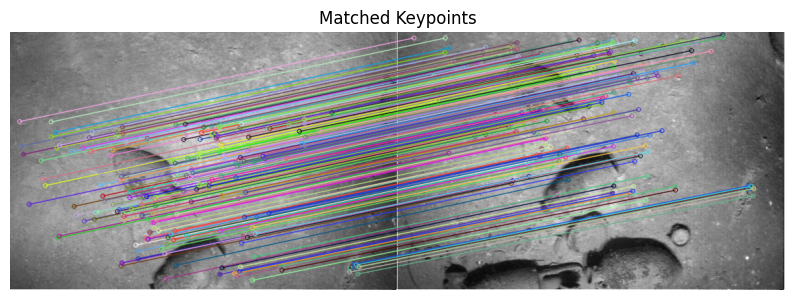

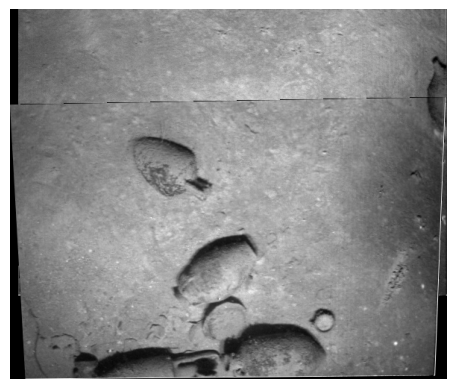

Entered Matching between two images
Image1 keypoints: 14206
Image2 keypoints: 8766
Number of good matches: 275
Refined homography matrix using Levenberg-Marquardt optimization
Number of inlier matches after RANSAC: 184


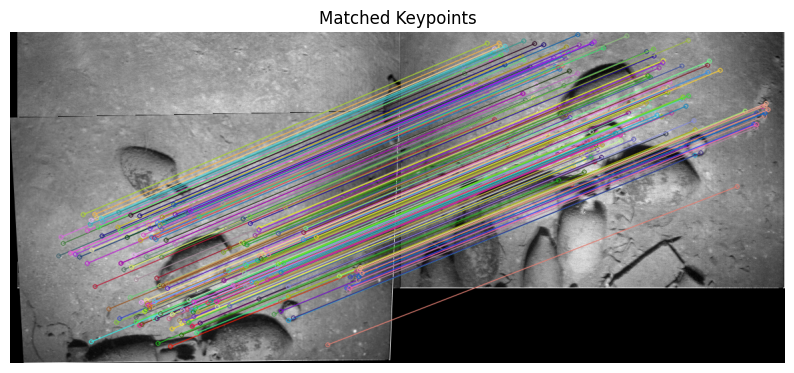

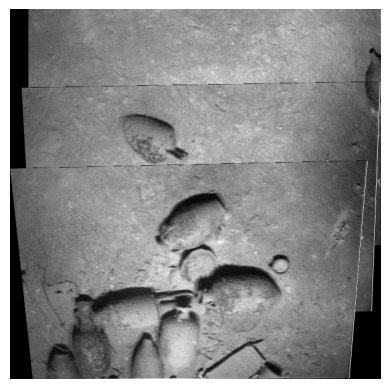

Entered Matching between two images
Image1 keypoints: 16098
Image2 keypoints: 8680
Number of good matches: 54
Refined homography matrix using Levenberg-Marquardt optimization
Number of inlier matches after RANSAC: 13


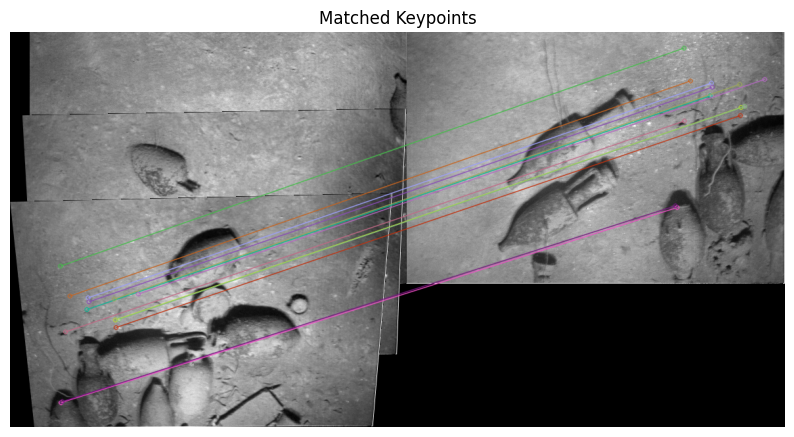

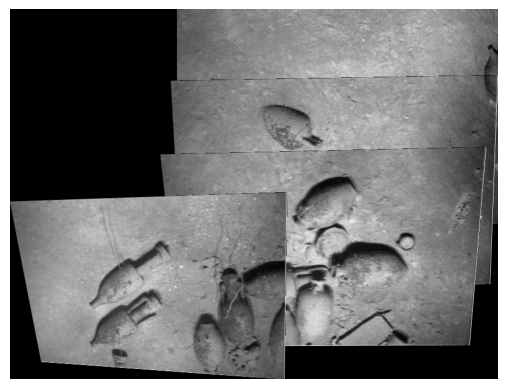

Entered Matching between two images
Image1 keypoints: 18952
Image2 keypoints: 9027
Number of good matches: 229
Refined homography matrix using Levenberg-Marquardt optimization
Number of inlier matches after RANSAC: 183


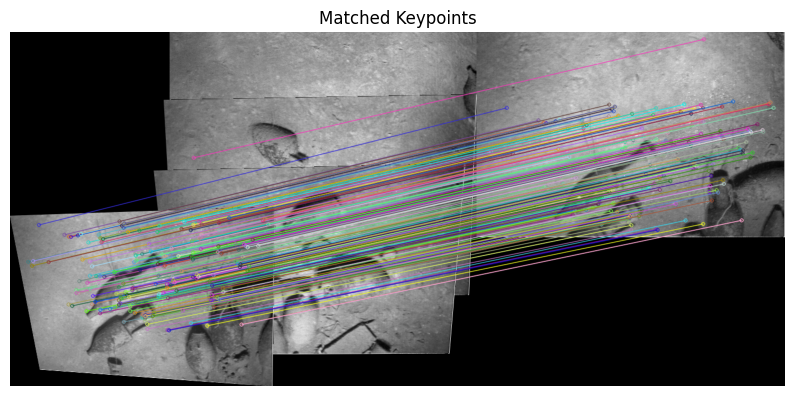

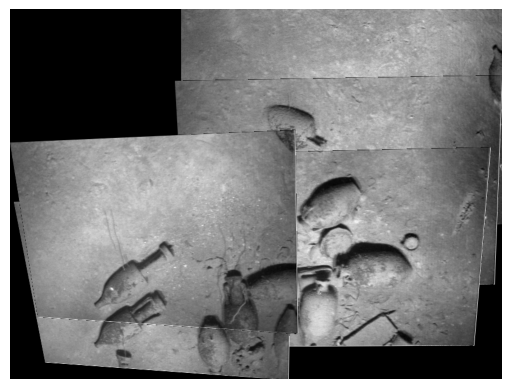

Entered Matching between two images
Image1 keypoints: 20115
Image2 keypoints: 10060
Number of good matches: 251
Refined homography matrix using Levenberg-Marquardt optimization
Number of inlier matches after RANSAC: 182


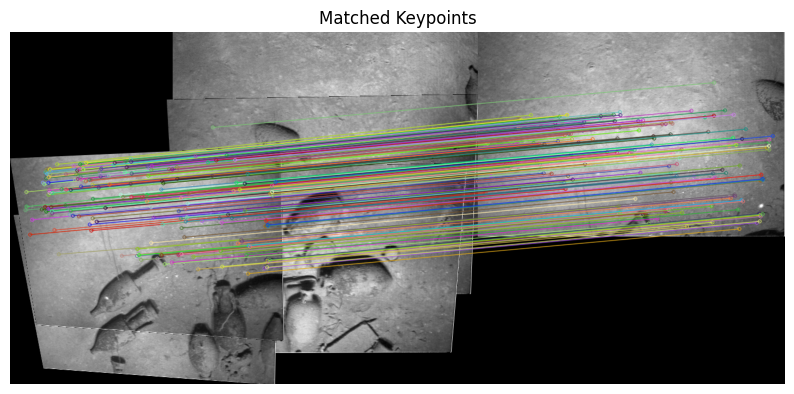

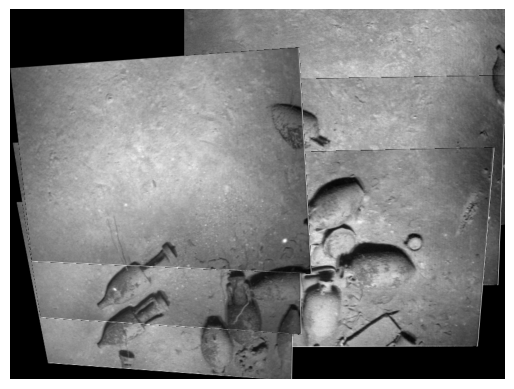

In [5]:
# Load images
Images = images
BaseImage = Images[0]
# Loop through the remaining images and stitch them together
for i in range(1, len(Images)):
    StitchedImage = create_panorama([BaseImage, Images[i]])
    BaseImage = StitchedImage.copy()
    # Display the current stitched image
    plt.figure()
    plt.imshow(cv2.cvtColor(BaseImage, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

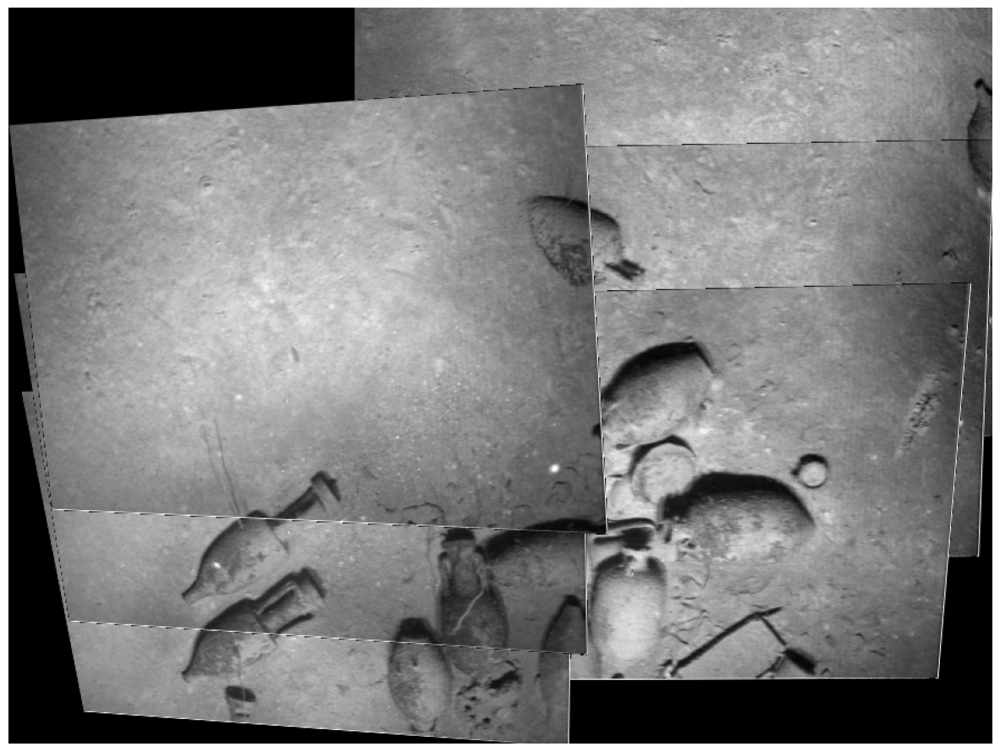

In [6]:
# Display the final stitched image
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(BaseImage, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Now i am trying SIFT feature detection for Non-Sequencial pairs
## PART 1
### (B)

### Pair 1-6 using SIFT

visualization of feature matching without RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 9606
Image2 keypoints: 9027
Number of good matches: 38


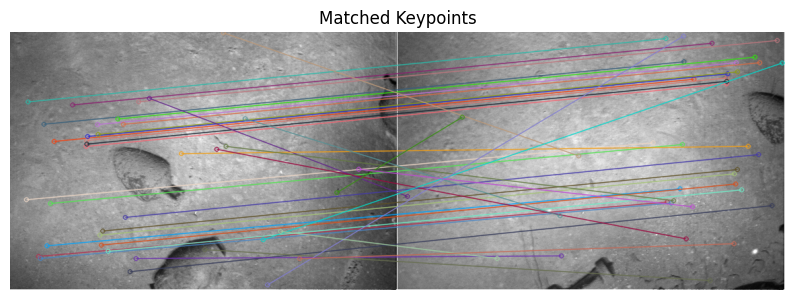

visualization of feature matching with RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 10000
Image2 keypoints: 10060
Number of good matches: 37
Refined homography matrix using Levenberg-Marquardt optimization
Number of inlier matches after RANSAC: 20


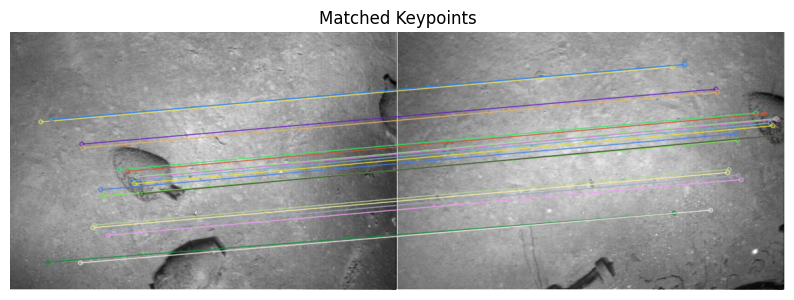

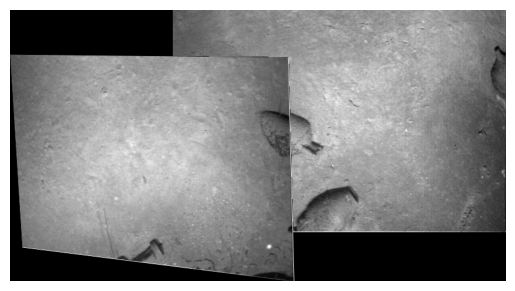

In [7]:
print("visualization of feature matching without RANSAC algorithm")
good_matches2, keypoints2, keypoints5 = find_matches(images[1],images[4],mode=2, flag=False)
display_matches(images[0], keypoints2, images[5], keypoints5, good_matches2)

print("visualization of feature matching with RANSAC algorithm")
StitchedImage = create_panorama([Images[0], Images[5]])
BaseImage = StitchedImage.copy()

# Convert from BGR to RGB before displaying with matplotlib
BaseImage_RGB = cv2.cvtColor(BaseImage, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(BaseImage_RGB)
plt.axis('off')
plt.show()

### Pair 2-5 using SIFT

visualization of feature matching without RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 9606
Image2 keypoints: 9027
Number of good matches: 38


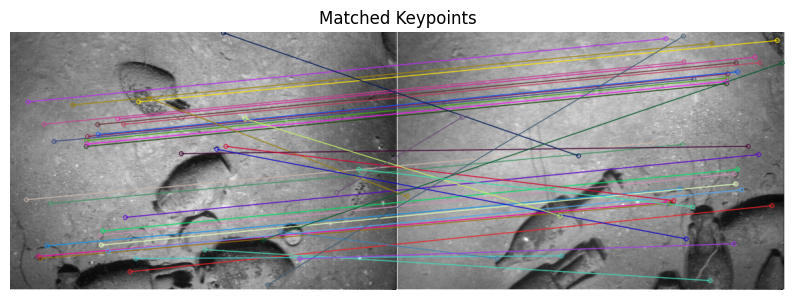

visualization of feature matching with RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 9606
Image2 keypoints: 9027
Number of good matches: 38
Refined homography matrix using Levenberg-Marquardt optimization
Number of inlier matches after RANSAC: 18


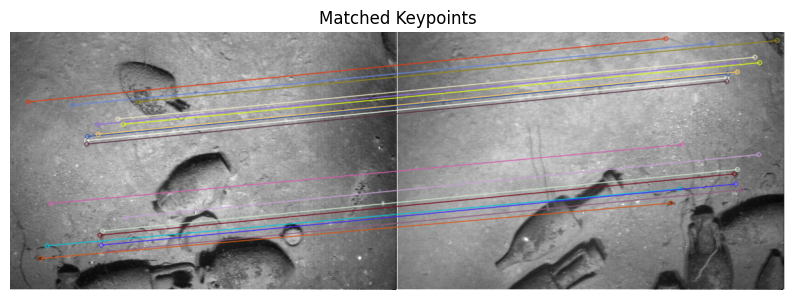

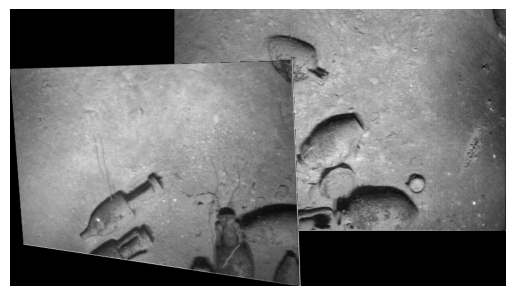

In [8]:
print("visualization of feature matching without RANSAC algorithm")
good_matches2, keypoints2, keypoints5 = find_matches(images[1],images[4],mode=2, flag=False)
display_matches(images[1], keypoints2, images[4], keypoints5, good_matches2)

print("visualization of feature matching with RANSAC algorithm")
StitchedImage = create_panorama([Images[1], Images[4]])
BaseImage = StitchedImage.copy()

# Convert from BGR to RGB before displaying with matplotlib
BaseImage_RGB = cv2.cvtColor(BaseImage, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(BaseImage_RGB)
plt.axis('off')
plt.show()

### Pair 2-4 using SIFT

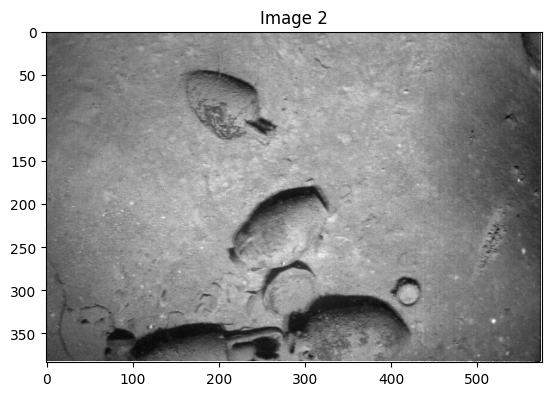

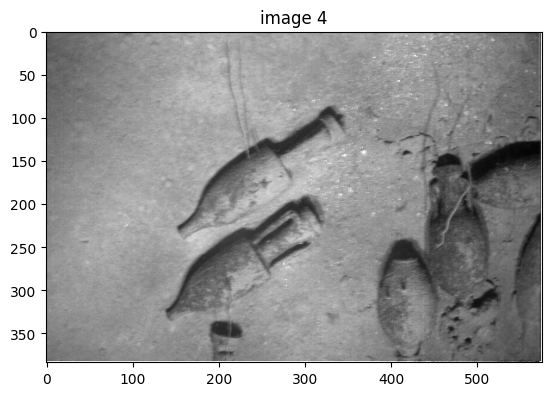

visualization of feature matching without RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 9606
Image2 keypoints: 8680
Number of good matches: 32


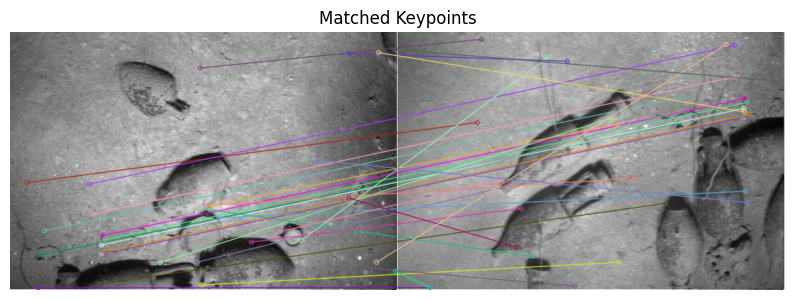

visualization of feature matching with RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 9606
Image2 keypoints: 8680
Number of good matches: 32
Refined homography matrix using Levenberg-Marquardt optimization
Number of inlier matches after RANSAC: 9


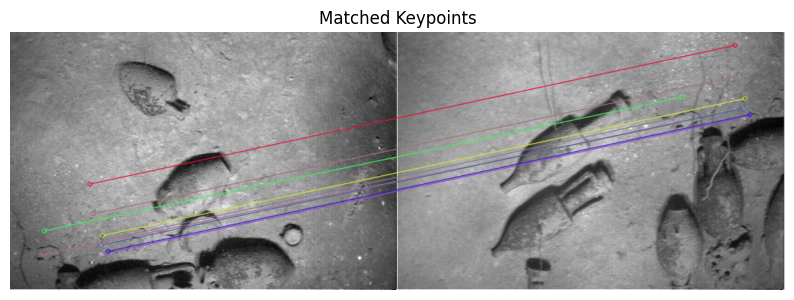

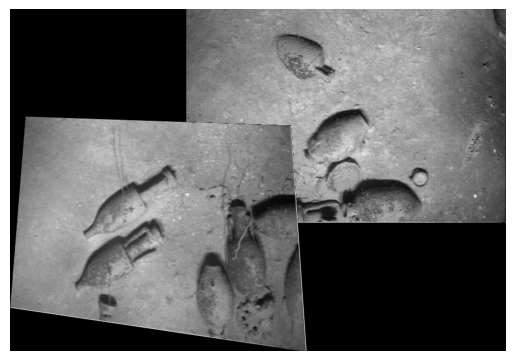

In [9]:
plt.title('Image 2')
plt.imshow(Images[1])
plt.show()
plt.title('image 4')
plt.imshow(Images[3])
plt.show()

print("visualization of feature matching without RANSAC algorithm")
good_matches3, keypoints2, keypoints4 = find_matches(images[1],images[3],mode=2, flag=False)
display_matches(images[1], keypoints2, images[3], keypoints4, good_matches3)

print("visualization of feature matching with RANSAC algorithm")
StitchedImage = create_panorama([Images[1], Images[3]])
BaseImage = StitchedImage.copy()

# Convert from BGR to RGB before displaying with matplotlib
BaseImage_RGB = cv2.cvtColor(BaseImage, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(BaseImage_RGB)
plt.axis('off')
plt.show()

### Pair 3-5 using SIFT

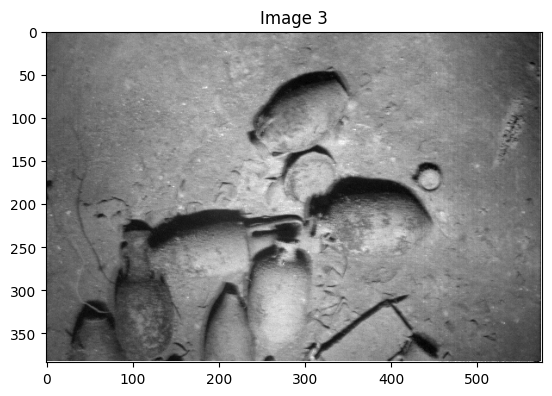

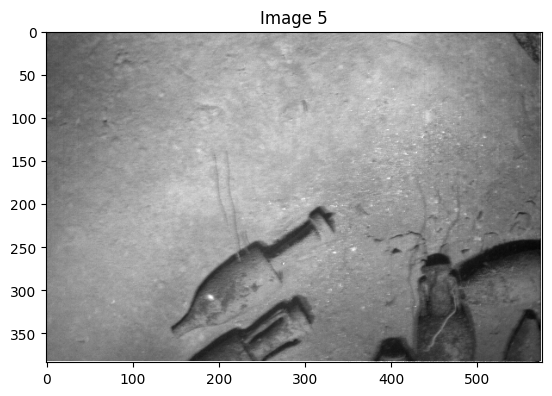

visualization of feature matching without RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 8766
Image2 keypoints: 9027
Number of good matches: 32


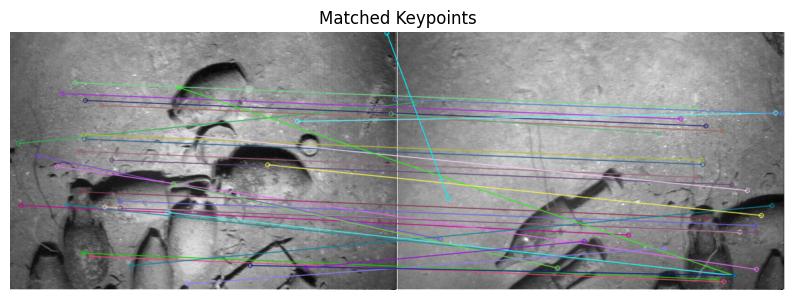

visualization of feature matching with RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 8766
Image2 keypoints: 9027
Number of good matches: 32
Refined homography matrix using Levenberg-Marquardt optimization
Number of inlier matches after RANSAC: 11


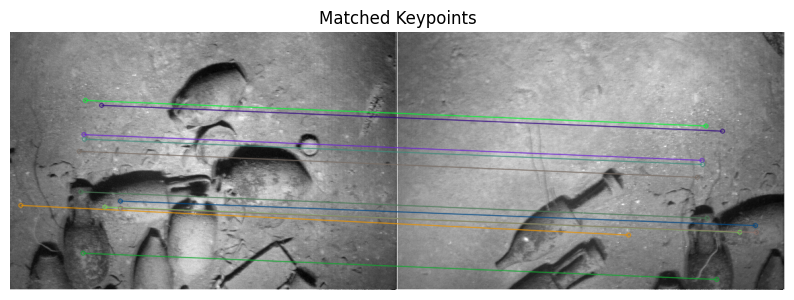

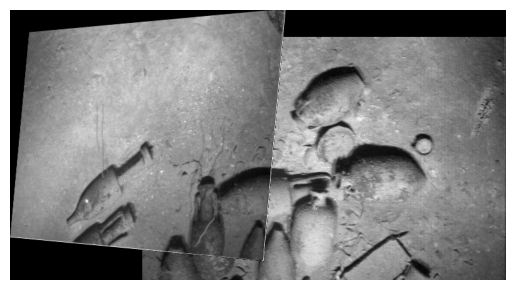

In [10]:
plt.title('Image 3')
plt.imshow(Images[2])
plt.show()
plt.title('Image 5')
plt.imshow(Images[4])
plt.show()

print("visualization of feature matching without RANSAC algorithm")
good_matches4, keypoints3, keypoints5 = find_matches(images[2],images[4],mode=2, flag=False)
display_matches(images[2], keypoints3, images[4], keypoints5, good_matches4)

print("visualization of feature matching with RANSAC algorithm")
StitchedImage = create_panorama([Images[2], Images[4]])
BaseImage = StitchedImage.copy()

# Convert from BGR to RGB before displaying with matplotlib
BaseImage_RGB = cv2.cvtColor(BaseImage, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(BaseImage_RGB)
plt.axis('off')
plt.show()

### Pair 1-5 using SIFT

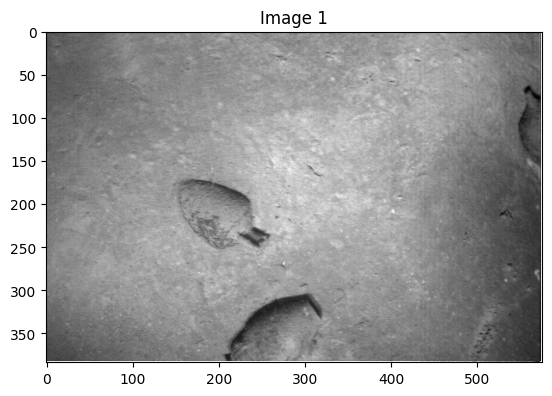

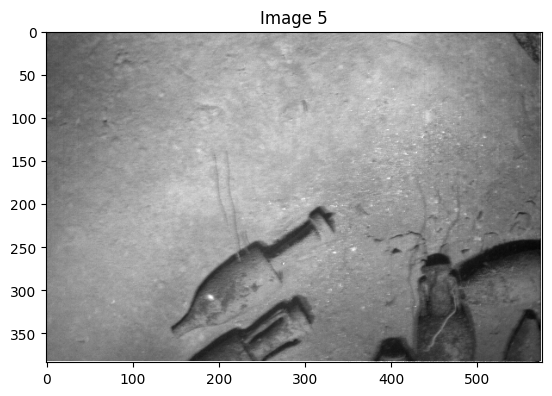

visualization of feature matching without RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 10000
Image2 keypoints: 9027
Number of good matches: 17


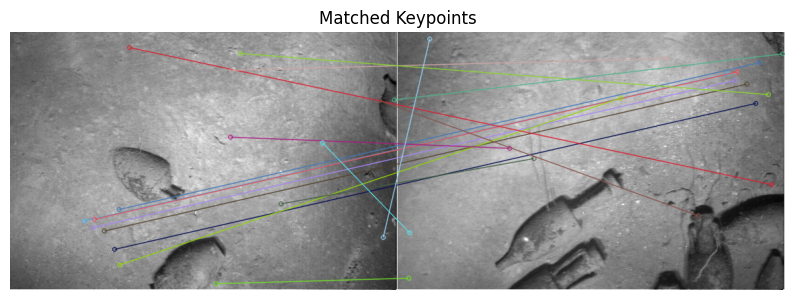

visualization of feature matching with RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 10000
Image2 keypoints: 9027
Number of good matches: 17
Refined homography matrix using Levenberg-Marquardt optimization
Number of inlier matches after RANSAC: 6


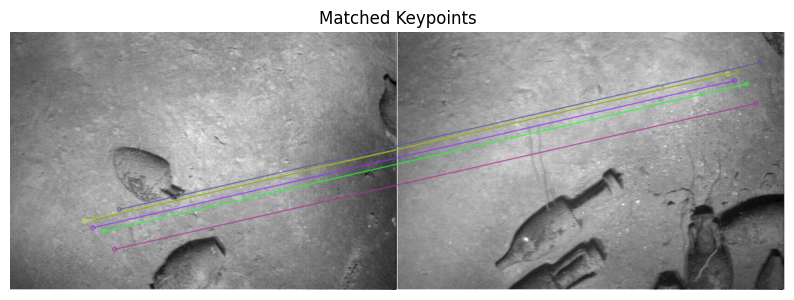

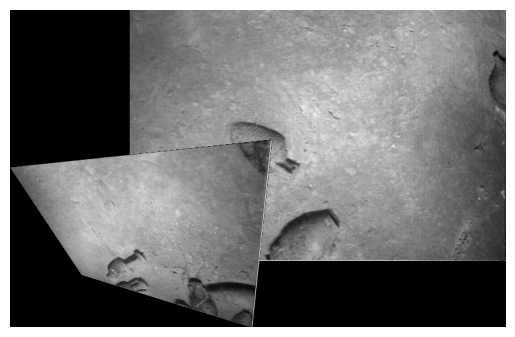

In [11]:
plt.title('Image 1')
plt.imshow(Images[0])
plt.show()
plt.title('Image 5')
plt.imshow(Images[4])
plt.show()

print("visualization of feature matching without RANSAC algorithm")
good_matches5, keypoints1, keypoints5 = find_matches(images[0],images[4],mode=2, flag=False)
display_matches(images[0], keypoints1, images[4], keypoints5, good_matches5)

print("visualization of feature matching with RANSAC algorithm")
StitchedImage = create_panorama([Images[0], Images[4]])
BaseImage = StitchedImage.copy()

# Convert from BGR to RGB before displaying with matplotlib
BaseImage_RGB = cv2.cvtColor(BaseImage, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(BaseImage_RGB)
plt.axis('off')
plt.show()

### Pair 2-6 using SIFT

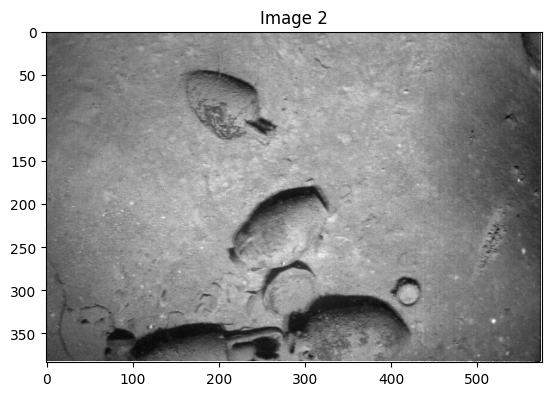

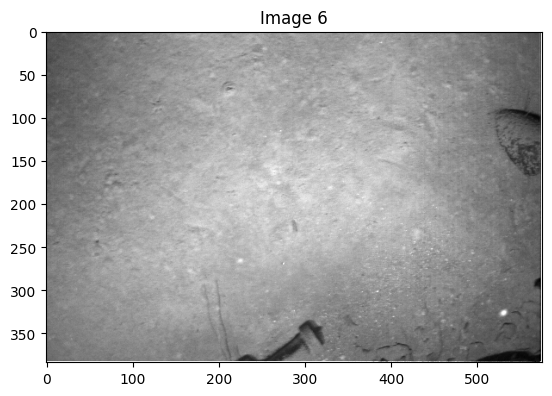

visualization of feature matching without RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 9606
Image2 keypoints: 10060
Number of good matches: 60


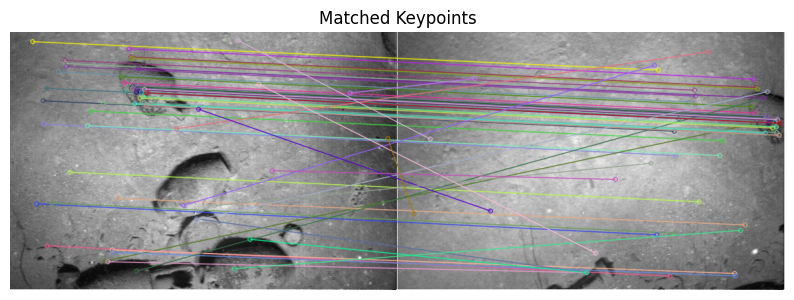

visualization of feature matching with RANSAC algorithm
Entered Matching between two images
Image1 keypoints: 9606
Image2 keypoints: 10060
Number of good matches: 60
Refined homography matrix using Levenberg-Marquardt optimization
Number of inlier matches after RANSAC: 34


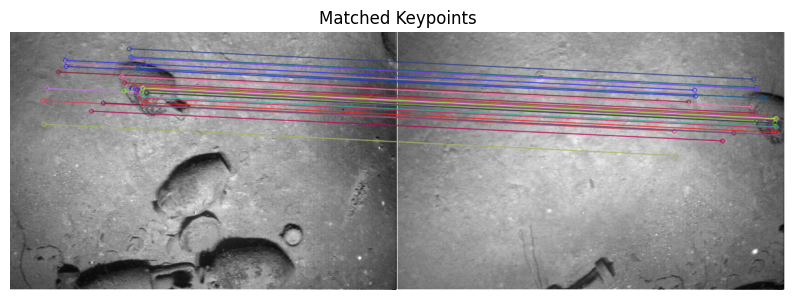

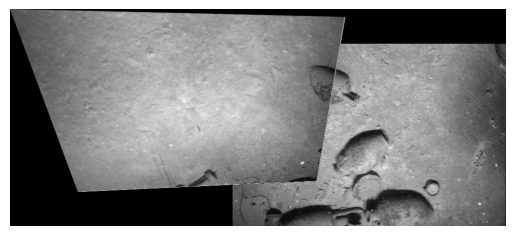

In [12]:
plt.title('Image 2')
plt.imshow(Images[1])
plt.show()
plt.title('Image 6')
plt.imshow(Images[5])
plt.show()

print("visualization of feature matching without RANSAC algorithm")
good_matches6, keypoints2, keypoints6 = find_matches(images[1],images[5],mode=2, flag=False)
display_matches(images[1], keypoints2, images[5], keypoints6, good_matches6)

print("visualization of feature matching with RANSAC algorithm")
StitchedImage = create_panorama([Images[1], Images[5]])
BaseImage = StitchedImage.copy()

# Convert from BGR to RGB before displaying with matplotlib
BaseImage_RGB = cv2.cvtColor(BaseImage, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(BaseImage_RGB)
plt.axis('off')
plt.show()